<a href="https://colab.research.google.com/github/fzampirolli/pdi-vc/blob/master/notebooks_alunos/py.fr/cap01/cap01_aluno.ipynb"><img src="imagens/colab-badge.png" style="height:20px;vertical-align:middle"></a>
<a href="https://github.com/fzampirolli/pdi-vc"><img src="imagens/github-badge.png" style="height:20px;vertical-align:middle"></a>

# 1 Fondements et Premiers Pas

Ce chapitre inaugure la **Partie 1** de l’ouvrage, consacrée aux fondements du Traitement Numérique des Images (TNI). Y sont présentés la représentation mathématique des images numériques et les principales méthodes pour leur manipulation.

On utilise le langage Python et la bibliothèque `morph.py` (ZAMPIROLLI, 2025).

## 1.1 Objectifs

À la fin de ce chapitre, vous serez capable de :

- Comprendre la nature physique et mathématique de l’image numérique $f(x,y)$.
- Identifier les bandes du spectre électromagnétique pertinentes pour le TNI.
- Effectuer les opérations de base : lecture, affichage et sauvegarde d’images.
- Accéder aux intensités des pixels et les modifier individuellement.
- Appliquer un seuillage manuel.

- Configurer l'environnement de développement en Python.
- Manipuler les structures de matrices (NumPy) sans tomber dans les pièges de la mémoire.

## 1.2 Avant de commencer : *Notebooks* interactifs

Ce matériel a été conçu selon le concept de ***Literate Programming*** (Programmation lettrée), imaginé par Donald Knuth dans les années 1980 (KNUTH, 1984). Knuth — également créateur du système **TeX** pour la typographie numérique — a proposé que les programmes soient écrits comme un récit logique destiné aux êtres humains, entrelaçant code et documentation.

Pour exécuter une cellule, appuyez sur <kbd>Shift</kbd> + <kbd>Enter</kbd> ou cliquez sur le bouton ▶️.

> ### 📝 Note sur le format
>
> Dans les versions rendues (PDF ou HTML), le code est présenté dans des blocs statiques à des fins de lecture et de référence. L'exécution interactive nécessite un accès via Google Colab (disponible en haut de la page) ou dans un environnement local via VSCode ou Jupyter Notebook.

## 1.3 Fondements

L'étude des systèmes basés sur l'image englobe un écosystème de disciplines intégrées qui transforment des données visuelles brutes en connaissances structurées. Tandis que certains domaines se concentrent sur la génération de représentations, d'autres se consacrent au traitement et à l'analyse de ces données pour soutenir des applications technologiques complexes.

Le diagramme présenté dans le [Figure 1.1](#fig-01-representacao) établit la distinction et la complémentarité entre le Traitement Numérique des Images (TNI) et la Vision par Ordinateur (VO). Le TNI, mis en évidence en **vert**, se concentre sur la transformation d'image en image, visant l'amélioration de la qualité ou le prétraitement, comme la suppression du bruit et le rehaussement du contraste.

En revanche, la VO, signalée en **bleu**, se focalise sur l'interprétation du contenu visuel pour extraire des modèles ou des informations, tels que la reconnaissance d'objets et de gestes. La région d'intersection illustre la synergie entre les domaines, où le TNI prépare les données visuelles pour l'interprétation par la VO. La carte démontre également les interconnexions des deux disciplines avec des domaines tels que la Robotique, l'Infographie, l'Intelligence Artificielle (IA) et les Neurosciences.

<figure id="fig-01-representacao" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-pdf-vc.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figure 1.1:</strong> Diagramme relationnel détaillant les distinctions fondamentales, les synergies et les interconnexions entre le TNI et la VO dans le contexte des systèmes basés sur l'image.</figcaption>
</figure>

### 1.3.1 👁️ Vision par ordinateur

- **Focus :** *Image → Modèle* (chemin inverse de l’infographie).  
- **Objectif :** Extraire des informations de haut niveau à partir d’images ou de vidéos.  
- **Applications typiques :**
  - Robotique – détection d’obstacles, localisation et navigation autonome.
  - Surveillance et inspection – reconnaissance d’événements, lecture de plaques, contrôle qualité.
  - Télédétection – analyse d’images satellite, cartographie environnementale.
  - Imagerie médicale – détection de tumeurs, segmentation d’organes, aide au diagnostic.
  - Interaction homme-machine – reconnaissance de gestes, expressions faciales, suivi oculaire.
- **Relation avec d’autres domaines :** utilise des techniques d’apprentissage automatique et d’IA pour classer et interpréter les scènes ; sert d’« yeux » à la robotique.

### 1.3.2 🖼️ Traitement Numérique des Images (TNI)

- **Focus :** *Image → Image* (généralement — transformation d'une image en une autre).  
- **Objectif :** Améliorer la qualité visuelle ou extraire des caractéristiques de bas niveau.  
- **Applications courantes :**
  - Élimination du bruit (filtres moyenne, médiane, gaussien).
  - Amélioration du contraste (égalisation d'histogramme, ajustement gamma).
  - Détection des contours (Sobel, Canny, Laplacien).
  - Segmentation (seuillage, croissance de régions, *watershed*).
  - Transformations géométriques (redimensionnement, rotation, correction de perspective).
- **Relation avec d'autres domaines (voir [Tableau 1.1](#tbl-01-relacoes)) :**  
  - C'est la **base** de la plupart des systèmes de VC (prétraitement).  
  - L'infographie applique souvent le TNI pour le post-traitement (ex. : lissage, rehaussement).  
  - Les techniques d'IA peuvent optimiser les paramètres de traitement (ex. : apprentissage de filtres).

<a id="tbl-01-relacoes"></a>

**Tabela 1.1:** Connexion entre le PDI, la VC et d'autres domaines scientifiques.

| Domaine                     | Relation avec le PDI et la VC                                                                 |
|---------------------------|--------------------------------------------------------------------------------------|
| **Intelligence artificielle** | Fournit des modèles (réseaux de neurones, SVM) qui interprètent les sorties de la VC.                    |
| **Robotique** | Consomme des données de la VC pour prendre des décisions (navigation, manipulation).                     |
| **Apprentissage automatique**| Utilise des descripteurs extraits par le PDI/VC pour entraîner des classifieurs.                   |
| **Infographie** | Chemin inverse : *modèle → image* ; applique souvent le PDI pour un rendu réaliste. |
| **Neuroscience** | Inspire des modèles de PDI (ex. : filtres similaires aux cellules ganglionnaires de la rétine).   |


## 1.4 Étapes du PDI

Les étapes du PDI sont présentées dans la [Figure 1.2](#fig-01-etapas) et peuvent être comprises comme une chaîne de transformations qui réduit la redondance des données afin d’en extraire du sens :

*   **Niveau bas :** agit directement sur les pixels de l’image bruitée pour effectuer des améliorations et des filtrages, en produisant en sortie une image propre ou rehaussée.
*   **Niveau moyen :** reçoit l’image traitée, effectue la segmentation et la description, transformant la matrice de pixels en attributs structurés (forme, taille et texture).
*   **Niveau haut :** utilise la table d’attributs pour alimenter des processus logiques et d’intelligence artificielle, aboutissant à la décision ou à la reconnaissance finale (comme le diagnostic médical).

<figure id="fig-01-etapas" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-etapas.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figure 1.2:</strong> Représentation du flux séquentiel de traitement : la sortie de chaque niveau devient l’entrée du niveau suivant.</figcaption>
</figure>

A [Figure 1.3](#fig-01-etapas2) détaille la séquence complète du PDI, depuis la capture jusqu'à l'interprétation. Le flux commence à l'acquisition de l'image (1) et se poursuit avec l'amélioration (2) et la restauration (3). Ensuite, le contenu est isolé par la segmentation (4) et affiné par la morphologie (5). La transition cruciale se produit à la représentation et à la description (6), où les objets visuels sont convertis en données mathématiques (aire, périmètre, etc.), permettant la reconnaissance (7). Les processus auxiliaires incluent le traitement d'image couleur et la compression, qui contribuent à l'efficacité du stockage et de l'analyse.


<figure id="fig-01-etapas2" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-etapas2.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figure 1.3:</strong> Flux détaillé du PDI : de l'acquisition sensorielle à l'extraction d'attributs et à la reconnaissance automatisée, incluant le traitement couleur et la compression.</figcaption>
</figure>

## 1.5 Formation de l’image et le spectre

Le processus de formation d’une image repose sur l’interaction entre la matière et l’énergie rayonnante. Essentiellement, une image est conçue lorsqu’un **capteur enregistre le rayonnement** issu de l’interaction avec un objet physique. Dans le contexte de la vision humaine et de la photographie conventionnelle, ce phénomène dépend d’une source de lumière qui éclaire la scène ; les caractéristiques des objets sont alors codées par le biais des **variations d’intensité et de couleur** de la lumière qui atteint le capteur, comme illustré dans la [Figure 1.4](#fig-01-luz).

<figure id="fig-01-luz" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-luz.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figure 1.4:</strong> Représentation du spectre visible et de sa position par rapport aux autres rayonnements électromagnétiques, mettant en évidence la variation des longueurs d’onde de 380 nm à 750 nm.</figcaption>
</figure>

La **lumière visible** n'occupe qu'une petite bande du spectre électromagnétique — entre **380 nm (violet)** et **750 nm (rouge)** — comme illustré dans la [Figure 1.5](#fig-01-espectro). Les capteurs numériques classiques opèrent dans cette même fenêtre, mais des équipements spécialisés peuvent capter des rayonnements invisibles à l'œil humain, tels que l'infrarouge et les rayons X. En PDI, l'image formée dépend directement de la sensibilité spectrale du capteur utilisé.

<figure id="fig-01-espectro" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-espectro.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figure 1.5:</strong> \(A\) Spectre électromagnétique complet en échelle logarithmique, avec mise en évidence de la bande visible. (B) Détail de la lumière visible (380-750 nm) et de ses couleurs. (C) Décomposition de la lumière blanche par le prisme : la longueur d'onde la plus courte subit une réfraction plus grande, séparant UV, visible et infrarouge.</figcaption>
</figure>

À partir de ce processus physique d’acquisition, il devient possible de modéliser mathématiquement l’image numérique comme une fonction bidimensionnelle discrète, dans laquelle chaque point de la scène est représenté par des échantillons numériques d’intensité lumineuse, formalisant ainsi les concepts de pixel et d’image numérique présentés dans la section suivante.

## 1.6 Qu'est-ce qu'une image numérique ?

Une **image numérique** est constituée d'une grille de **pixels** (*Picture Elements*), où chaque pixel est la plus petite unité élémentaire de l'image.

> ### 💡 1.6.1 Qu'est-ce qu'un pixel ?
>
> Un **pixel** est la plus petite unité adressable qui compose une image numérique. Chaque pixel occupe une position unique dans la grille et stocke une ou plusieurs valeurs numériques qui représentent son intensité ou sa couleur.

### Représentation mathématique

Contrairement à une fonction continue, le domaine d'une image numérique est un plan rectangulaire fini $\mathbb{E} \subset \mathbb{Z}^2$, qui représente la grille d'échantillonnage. Ce domaine est indexé par des coordonnées entières :

<a id="eq-01-dominio"></a>
$$
\mathbb{E}  = \{ (x, y) \in \mathbb{Z}^2 \mid 0 \le x < L,\; 0 \le y < H \} \tag{1.1}
$$


Où :

*   **$L$** : représente la largeur de l'image (nombre de colonnes).
*   **$H$** : représente la hauteur de l'image (nombre de lignes).

L'image numérique est une fonction qui associe à chaque paire de coordonnées $(x,y)$ une ou plusieurs valeurs décrivant l'apparence du pixel.

<a id="eq-01-image"></a>
$$
f: \mathbb{E}  \to \mathcal{V} \tag{1.2}
$$


L'ensemble $\mathcal{V}$ définit les valeurs possibles pour le pixel (codomaine), variant selon le type d'image, comme illustré dans la [Tableau 1.2](#tbl-01-tipos-imagem).

<a id="tbl-01-tipos-imagem"></a>

**Tabela 1.2:** Principaux types d'image numérique et leurs ensembles respectifs de valeurs possibles pour chaque pixel.

| Type d'image | $\mathcal{V}$ (valeurs du pixel) | Représentation |
|:---|:---|:---:|
| **Binaire** | $\{0, 1\}$ ou $\{0, 255\}$ | ⬛◻️ |
| **Niveaux de gris** | $\{0, 1, \dots, 255\}$ | ░▒▓█ |
| **Couleur (RVB)** | $\{0, \dots, 255\}^3$ (triplets ordonnés de valeurs) | 🟥🟩🟦 |


**Exemple pratique :** Une image couleur dans le modèle RVB peut être représentée mathématiquement par une fonction qui associe trois valeurs d'intensité à chaque pixel. Informatiquement, cette représentation correspond à trois matrices superposées — les canaux rouge (*Red*), vert (*Green*) et bleu (*Blue*) — dans lesquelles chaque élément stocke l'intensité lumineuse du canal respectif à une position donnée de l'image.

Pour rendre possibles les expériences pratiques de PDI et de VC, ce livre utilise l'écosystème scientifique de Python, en intégrant des bibliothèques dédiées à la manipulation matricielle, au traitement d'images et à la visualisation des résultats, présentées ci-dessous.

## 1.7 Configuration de l’environnement

Ce matériel utilise l’écosystème scientifique de Python, avec un accent particulier sur
**NumPy** (calcul matriciel), **OpenCV** (vision par ordinateur) et la
bibliothèque **morph.py** (ZAMPIROLLI, 2025), développée à des fins
pédagogiques et utilisée tout au long de ce livre, comme présenté dans la
[Tableau 1.3](#tbl-01-bibliotecas).

Le projet est actuellement disponible en **Python** et en **portugais**. Son
organisation permet toutefois son extension à d’autres langages de
programmation et à d’autres langues.

Les **Exercices de Programmation (EP)** présentés à la fin des chapitres
peuvent être validés par le module `testsuite.py`, qui permet d’exécuter des cas de
test dans différents langages, notamment Python, C, C++, Java, JavaScript et
R. Ainsi, les mêmes cas de test peuvent être utilisés pour vérifier
les solutions développées dans les *notebooks* et dans **Moodle/VPL**.

<a id="tbl-01-bibliotecas"></a>

**Tabela 1.3:** Principales bibliothèques et modules utilisés tout au long de ce livre pour le
calcul matriciel, le TNI, la VC, la visualisation et la validation des exercices.

| Bibliothèque     | Fonction principale                                     |
| :--------------- | :------------------------------------------------------ |
| `numpy`          | Représentation matricielle et opérations numériques     |
| `opencv-python`  | Lecture, écriture et opérations de vision par ordinateur|
| `matplotlib`     | Visualisation d’images et de graphiques                 |
| `morph.py`       | Abstraction didactique des opérations de TNI            |
| `testsuite.py`   | Exécution et validation automatique des EP              |


## 1.8 Versions de `morph.py`

La bibliothèque `morph.py` possède deux versions publiques :

* **Version 1.0** — version originale, publiée avec l’article
  présenté à EduComp 2024 :
  [dépôt de la version 1.0](https://github.com/fzampirolli/morph)

* **Version 1.1** — version utilisée dans les activités de ce livre :
  [dépôt de la version 1.1](https://github.com/fzampirolli/pdi-vc/blob/master/morph/morph.py)

La version 1.1 a été adaptée pour répondre également aux contraintes de mémoire du
**Moodle/VPL** (Laboratoire Virtuel de Programmation). Dans la version 1.0, certaines
bibliothèques, comme `matplotlib`, `requests` et `skimage`, étaient chargées au
moment du `import morph`. Dans des environnements aux ressources limitées, ce
chargement pouvait dépasser la limite de mémoire et produire des erreurs comme
`Jail: out of memory, 128MiB`.

Dans la version 1.1, ces *imports* ont été remplacés par un **chargement
*lazy*** : chaque bibliothèque n’est importée que par la méthode qui l’utilise
effectivement. Ainsi, la commande `import morph` maintient un chargement initial
réduit, utilisant principalement `numpy` et `cv2`, tandis que les ressources
supplémentaires sont chargées à la demande.

La configuration des *notebooks* est centralisée dans le fichier `config.py`,
disponible dans le même dépôt. Ce fichier vérifie les dépendances,
cherche à garantir l’utilisation d’**OpenCV 5.0** et met à disposition `morph.py` et, si
nécessaire, `testsuite.py`. Lorsque l’environnement ne dispose pas de la version adéquate
d’OpenCV, `config.py` peut réinstaller la version requise et, si nécessaire,
demander le redémarrage de l’environnement d’exécution.

Ainsi, les *notebooks* utilisent une routine de configuration unique,
réduisant la répétition de code et facilitant la reproduction de l’environnement
informatique utilisé dans ce livre.

In [1]:
import os, urllib.request

url = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/morph/config.py"
if not os.path.exists("config.py"):
    urllib.request.urlretrieve(url, "config.py")

import config
config.setup(testsuite=True)
from morph import mm
from testsuite import TestSuite

✅ Environnement prêt. Morph : 1.1.9 | OpenCV : 5.0.0 | TestSuite : 1.1.2


## 1.9 Fondements des matrices — attention à la copie de références

Comme une image numérique peut être représentée par une matrice, il est important de comprendre comment créer et manipuler correctement les matrices. En Python, il existe un piège courant lors de l'utilisation de l'opérateur `*` avec des listes :

> ### ⚠️ Attention à la copie de références
>
> Lors de l'exécution de `m = [[0]*2]*3`, trois lignes indépendantes ne sont pas créées. À la place, trois références vers la **même liste** sont créées. Par conséquent, la modification d'un élément dans l'une des lignes modifiera également l'élément correspondant dans les autres lignes.

Pour visualiser ce comportement, on peut exécuter le code sur [Python Tutor](https://pythontutor.com/) et le comparer avec la méthode correcte de création d'une matrice à l'aide de listes : `m = [[0]*2 for _ in range(3)]`.

En pratique, pour le traitement numérique des images (TNI), il est recommandé d'utiliser **NumPy**, qui fournit des structures de données multidimensionnelles efficaces et des opérations vectorisées adaptées à la manipulation d'images. Le code suivant présente différentes méthodes de création d'images synthétiques, dont les résultats sont affichés dans la [Figure 1.6](#fig-imagens-sinteticas).

Matrice aléatoire générée :
108 139  80  15 131 162 
218 154 251 166 226 177 
240 217  92  27 191 151 
159  80 128 238   2 189 



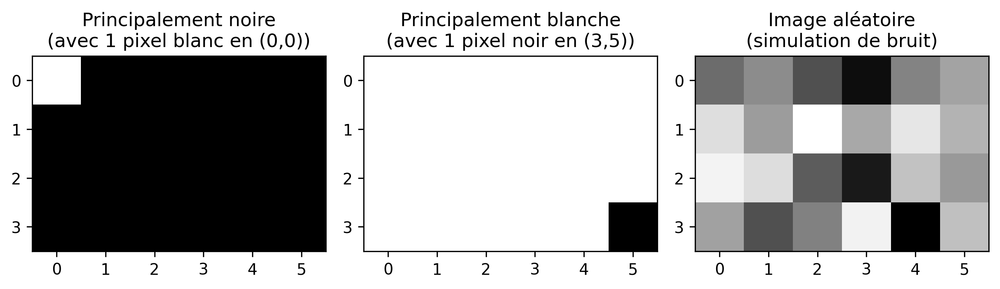

**Figure 1.6:** Exemples d


In [2]:
import numpy as np

# Création d'une image noire (zéros) de 4, 6 pixels
img_preta = np.zeros((4, 6), dtype='uint8')
img_preta[0,0] = 255  # pixel blanc en haut à gauche

# Création d'une image blanche (255) de 4, 6 pixels
img_branca = np.ones((4, 6), dtype='uint8') * 255
img_branca[3,5] = 0  # pixel noir en bas à droite

# Création d'une image aléatoire pour les tests (bruit)
img_random = mm.randomImage(4, 6, maxValue=255)

print("Matrice aléatoire générée :")
print(mm.drawImg(img_random))

mm.show(
    [img_preta, img_branca, img_random],
    titles=[
        "Principalement noire\n(avec 1 pixel blanc en (0,0))",
        "Principalement blanche\n(avec 1 pixel noir en (3,5))",
        "Image aléatoire\n(simulation de bruit)"
    ],
    cols=3,
    figsize=(9, 3),
    axis=True
)

## 1.10 Lecture et Affichage d'Images

Dans des bibliothèques comme [NumPy](https://numpy.org/?utm_source=chatgpt.com), [OpenCV](https://opencv.org/?utm_source=chatgpt.com) et [scikit-image](https://scikit-image.org/?utm_source=chatgpt.com), les images numériques sont souvent représentées informatiquement sous forme de *tableaux* NumPy. Ainsi, les opérations matricielles et les concepts d'algèbre linéaire peuvent être appliqués directement au traitement d'images numériques (TIN).

L'une des opérations fondamentales en PDI est la lecture d'images.

Dans la bibliothèque `morph.py`, la fonction `mm.read()` permet de charger des images à partir de fichiers locaux ou d'URLs, comme illustré dans la [Figure 1.7](#fig-01-natureza)..

Dimensions (H, W, Canaux) : (1365, 2048, 3)
Type de données : uint8


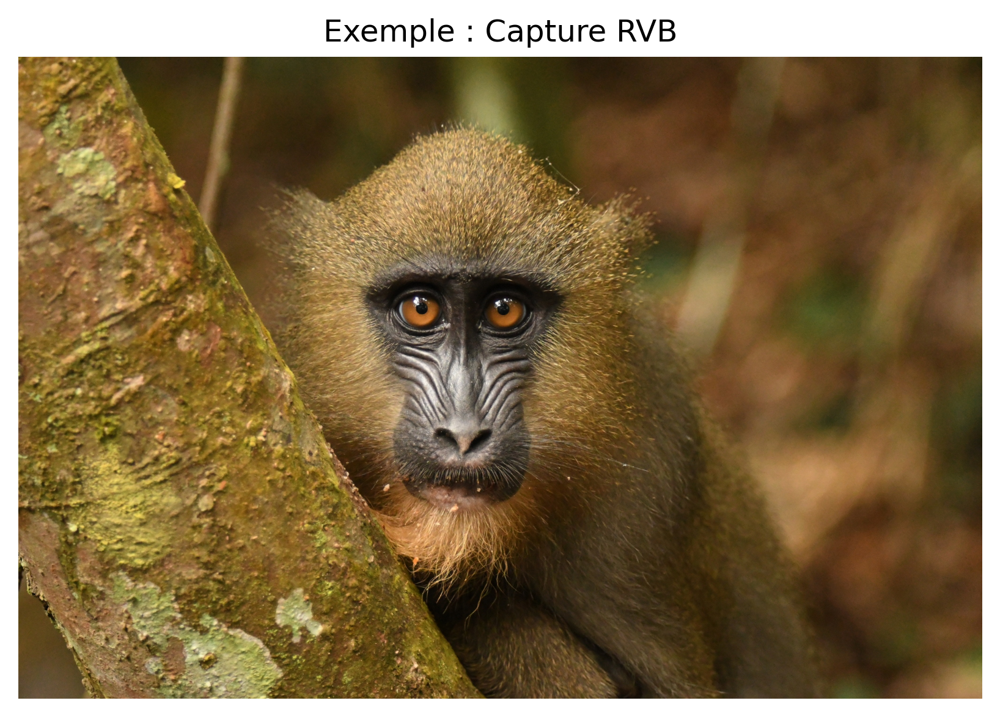

**Figure 1.7:** Mandrill (Mandrillus sphinx) en milieu naturel. Crédit : Julien Renoult (CC BY 4.0).


In [3]:
import os
import numpy as np

url     = "https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg"
caminho = "imagens/mandrill.png"

if not os.path.exists(caminho):
    os.makedirs("imagens", exist_ok=True)
    img_obj = mm.read(url, pil=True)
    mm.write(img_obj, caminho)
else:
    img_obj = mm.read(caminho, pil=True)

img = np.array(img_obj)

print(f"Dimensions (H, W, Canaux) : {img.shape}")
print(f"Type de données : {img.dtype}")

mm.show(img, title="Exemple : Capture RVB")

### Alternative : *Téléchargement* de l'image vers un stockage local

Dans les environnements où la lecture directe d'URL est indisponible — en raison de restrictions réseau, de politiques de pare-feu ou d'absence de connectivité — une alternative consiste à effectuer au préalable le *téléchargement* de l'image vers le système de fichiers local. Après le stockage, l'image peut être chargée normalement via la fonction `mm.read()`. Dans l'exemple suivant, le fichier est enregistré localement sous le nom `mandrill.png`.

```bash
!wget -O mandrill.png \
    https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg
```

```python
img = mm.read('mandrill.png')
mm.show(img, title="Exemple : Capture RVB (fichier local)")
```

#### Explication

* `wget -O mandrill.png <URL>` effectue le *téléchargement* de l'image et la stocke localement sous le nom spécifié ;
* `mm.read('mandrill.png')` lit le fichier directement depuis le système de fichiers, sans nécessiter de requêtes HTTP supplémentaires ;
* cette stratégie réduit la dépendance à la connectivité pendant l'exécution des expériences et évite les *téléchargements* répétés de la même image.

> ### 💡 Remarque
>
> Le préfixe `!` est utilisé dans les environnements basés sur les *carnets* (notebooks), comme [Jupyter Notebook](https://jupyter.org/?utm_source=chatgpt.com), [JupyterLab](https://jupyter.org/?utm_source=chatgpt.com) et [Google Colab](https://colab.research.google.com/?utm_source=chatgpt.com), pour exécuter des commandes du système d'exploitation directement dans des cellules de code. Dans les terminaux classiques, la commande doit être utilisée sans le préfixe `!`.
>
> Si l'utilitaire `wget` n'est pas installé, on peut utiliser en alternative :
>
> ```bash
> !curl -o mandrill.png \
>     https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg
> ```

## 1.11 Conversion de Types et Seuillage

Comme nous l'avons vu, une image couleur dans l'espace RVB est représentée par la fonction :

<a id="eq-01-cinza"></a>
$$
f: \mathbb{E} \to \{0,1,\dots,255\}^3
$$

C'est-à-dire que pour chaque pixel $(x,y)$, nous avons trois valeurs $(R,V,B)$ qui définissent sa couleur.

### Conversion en Niveaux de Gris

Pour convertir une image RVB en niveaux de gris (*grayscale*), il est nécessaire de combiner les trois canaux en une seule valeur d'intensité $g$, qui représente la luminosité perçue. Comme l'œil humain n'est pas également sensible au rouge, au vert et au bleu, on utilise une **moyenne pondérée**. La norme [ITU-R BT.601](https://www.itu.int/rec/R-REC-BT.601/) ({ITU-R}, 2011) définit les poids suivants :

$$
g = 0.299\,R + 0.587\,G + 0.114\,B \tag{1.3}
$$


Après le calcul, la valeur $g$ est arrondie à l'entier le plus proche et ajustée à l'intervalle $[0, 255]$. Le résultat est une nouvelle image, désormais en niveaux de gris, représentée par :

<a id="eq-01-limiar"></a>
$$
f_{\text{gris}}: \mathbb{E} \to \{0,1,\dots,255\}
$$

### Seuillage (*Thresholding*)

À partir de l'image en niveaux de gris $f_{\text{gris}}(x,y)$, une opération fondamentale est le **seuillage**, qui produit une image **binaire** (uniquement noir et blanc). Pour cela, on choisit une valeur de coupure $T$ (généralement dans l'intervalle $[0,255]$) et on définit :

$$
f_{\text{bin}}(x,y) = 
\begin{cases} 
255 & \text{si } f_{\text{gris}}(x,y) > T \\[4pt]
0 & \text{sinon}
\end{cases} \tag{1.4}
$$


**Exemple :** Avec $T = 128$, les pixels dont l'intensité est supérieure à 128 deviennent blancs (255) ; les autres deviennent noirs (0).

Le seuillage est largement utilisé pour **segmenter les objets du fond**, extraire les contours ou créer des masques binaires pour un traitement ultérieur.

> **Remarque :** La valeur 255 représente le blanc maximal dans les images 8 bits, tandis que 0 représente le noir absolu.

### Exemple pratique de conversion et de seuillage

La [Figure 1.8](#fig-01-processamento-basico) illustre les principales étapes pour transformer une image couleur en niveaux de gris, puis la convertir en image binaire par seuillage.
Le code suivant implémente ces étapes :

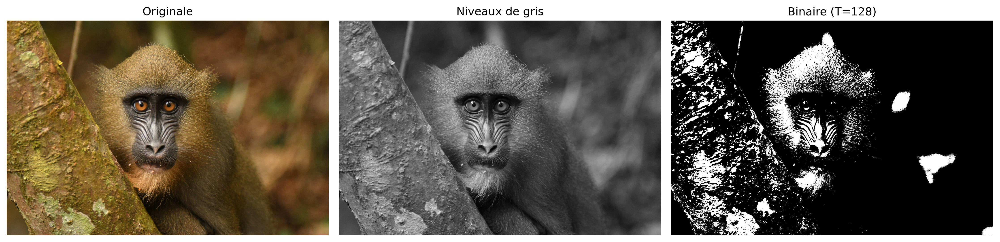

**Figure 1.8:** Traitement de base des images : (a) image originale, (b) image en niveaux de gris, (c) image binarisée par seuil (T=128).


In [4]:
# 1. Convertir en niveaux de gris
img_gray = mm.gray(img)

# 2. Appliquer un seuil (Pixels > 128 deviennent 255, autres 0)
limiar = 128
img_binaria = mm.threshold(img_gray, limiar)

# Utilisation de la nouvelle fonction
mm.show(
    [img, img_gray, img_binaria], 
    titles=["Originale", "Niveaux de gris", f"Binaire (T={limiar})"],
    cols=3
)

## 1.12 Limiarisation par la méthode d’Otsu

Comme présenté dans la [Équation 1.4](#eq-01-limiar), la limiarisation convertit une image en niveaux de gris en une image binaire à l’aide d’un seuil $T$. Jusqu’à présent, nous avons fixé manuellement $T = 128$.

```python
img_bin_fixo = mm.threshold(img_gray, T=128)
```

Cependant, le choix manuel de $T$ n’est pas toujours trivial. La bibliothèque `mm` offre une alternative automatique : lorsque le paramètre `limiar` **n’est pas fourni**, la fonction `mm.threshold(img_gray)` calcule la valeur de $T$ selon la **méthode d’Otsu** (OTSU, 1979). Cette méthode, qui sera détaillée dans les chapitres suivants, maximise la variance interclasses de l’histogramme (fréquence de chaque niveau de gris), séparant automatiquement les pixels de l’objet et du fond.

Le code ci-dessous compare la limiarisation manuelle ($T=128$) avec l’automatique (Otsu), affichant également la valeur de $T$ calculée :

Seuil calculé par Otsu : T = 95.0


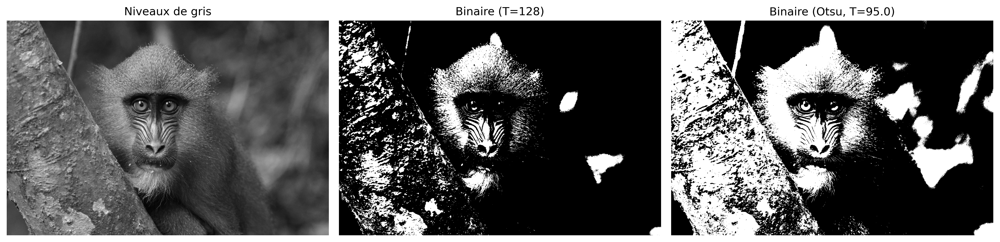

**Figure 1.9:** Comparaison entre seuillage manuel (T=128) et automatique (Otsu) sur l


In [5]:
import cv2
# Seuillage avec T fixe (manuel)
T_fixo = 128
img_bin_fixo = mm.threshold(img_gray, T_fixo)

# Seuillage par la méthode d'Otsu (T automatique)
T_otsu, img_bin_otsu = cv2.threshold(img_gray, 0, 255,
                                      cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f'Seuil calculé par Otsu : T = {T_otsu}')
# ou simplement :
# img_bin_otsu = mm.threshold(img_gray)

# Affichage côte à côte
mm.show(
    [img_gray, img_bin_fixo, img_bin_otsu], 
    titles=["Niveaux de gris", f"Binaire (T={T_fixo})", f"Binaire (Otsu, T={T_otsu})"],
    cols=3
)

La [Figure 1.9](#fig-01-otsu) montre que le seuil obtenu par Otsu s’adapte automatiquement à l’image, permettant une binarisation plus efficace qu’une valeur fixe, en particulier lorsque les intensités de l’objet et du fond sont bien séparées dans l’histogramme. Cette technique est largement utilisée dans les systèmes de vision par ordinateur (VC) pour la binarisation de documents, la détection d’objets et le prétraitement d’images.

> ### 💡 Simplicité de la bibliothèque `morph.py`
>
> Alors qu'OpenCV exige l'appel complet :
>
> ```python
> T_otsu, img_bin = cv2.threshold(img_gray, 0, 255,
>                                 cv2.THRESH_BINARY + cv2.THRESH_OTSU)
> ```
>
> la bibliothèque `mm` abstrait toute cette complexité : il suffit d'appeler `mm.threshold(img_gray)`. Le seuil d'Otsu est calculé automatiquement et l'image binaire est retournée directement. Cette approche permet de se concentrer sur le concept, et non sur les détails d'implémentation.

## 1.13 Accès aux pixels

En Python avec NumPy, une image est structurée comme un **tableau multidimensionnel**. L'accès à un pixel spécifique utilise la convention matricielle **ligne** (axe Y) et **colonne** (axe X) : `img[ligne, colonne]`.

Le code de la [Figure 1.10](#fig-01-pixel-acesso) démontre comment extraire ces valeurs dans des images colorées (RGB) et en niveaux de gris, ainsi que l'isolement du voisinage immédiat du point d'intérêt.

📌 VALEURS AU PIXEL CIBLE (600, 800):
   • Tons de gris (Scalaire) : 81
   • Coloré (Vecteur RGB)    : R=92, G=78, B=67
--------------------------------------------------
🔍 MATRICE DE VOISINAGE 3x3 EN TONS DE GRIS:
   (Le pixel cible central est mis en évidence entre crochets)

     83    96   105 
     85  [ 81]   96 
     83    77    84 


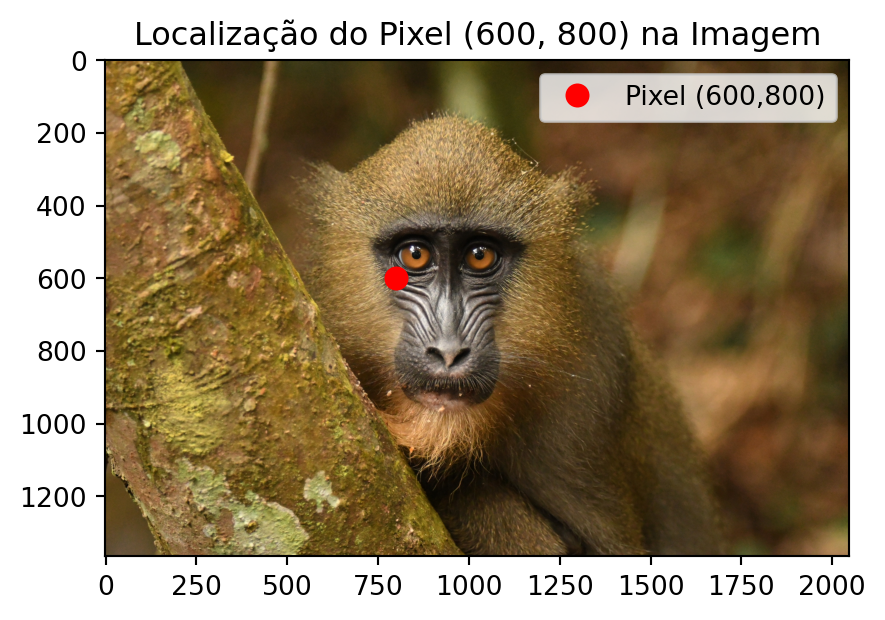

**Figure 1.10:** Acesso a um pixel específico (r, c) e a representação de sua vizinhança na imagem.


In [6]:
import matplotlib.pyplot as plt

# 1. Définition des coordonnées du pixel cible
r, c = 600, 800

# 2. Accès direct aux valeurs des pixels
pixel_cinza = img_gray[r, c]
pixel_rgb   = img[r, c]

print(f"📌 VALEURS AU PIXEL CIBLE ({r}, {c}):")
print(f"   • Tons de gris (Scalaire) : {pixel_cinza}")
print(f"   • Coloré (Vecteur RGB)    : R={pixel_rgb[0]}, G={pixel_rgb[1]}, B={pixel_rgb[2]}")
print("-" * 50)

# 3. Affichage didactique du voisinage 3x3 autour du pixel (r, c)
# Découpe de la ligne r-1 à r+1, et de la colonne c-1 à c+1
vizinhanca_gray = img_gray[r-1:r+2, c-1:c+2]

print(f"🔍 MATRICE DE VOISINAGE 3x3 EN TONS DE GRIS:")
print(f"   (Le pixel cible central est mis en évidence entre crochets)\n")

# Impression formatée pour mettre en évidence le pixel central
for i, linha in enumerate(vizinhanca_gray):
    linhas_str = []
    for j, valor in enumerate(linha):
        if i == 1 and j == 1:
            linhas_str.append(f"[{valor:3d}]") # Met en évidence le centre (100, 100)
        else:
            linhas_str.append(f" {valor:3d} ")
    print("   " + " ".join(linhas_str))

# 4. Démonstration visuelle avec mm.show (optionnel, mais excellent pour le livre)
# Affiche l'image entière avec un point délimitant la région
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.plot(c, r, 'ro', markersize=8, label=f'Pixel ({r},{c})') # Trace (x, y) -> (c, r)
plt.title(f"Localização do Pixel ({r}, {c}) na Imagem")
plt.legend()
plt.axis('on') # Garde les axes pour que l'étudiant voie les coordonnées 100, 100
plt.show()

**Explication ligne par ligne :**

1. `img_gray[r, c]` — Renvoie une valeur entière unique (scalaire) comprise entre 0 et 255, représentant l'intensité de luminosité du gris.
2. `img[r, c]` — Renvoie un vecteur de trois valeurs `[R, V, B]`, correspondant aux intensités des canaux Rouge, Vert et Bleu.
3. `img_gray[r-1:r+2, c-1:c+2]` — Effectue un découpage (*slicing*) pour extraire la sous-matrice $3\times 3$ autour du pixel. Cette opération est la base pour l'implémentation de filtres spatiaux et de convolutions.
4. La boucle `for` suivante formate simplement cette sous-matrice dans la console, affichant le pixel central entre crochets `[ ]` à des fins pédagogiques.
5. La fonction `plt.plot(c, r, 'ro')` trace un point rouge sur l'image pour corréler la coordonnée numérique avec sa position visuelle. Notez que Matplotlib utilise l'ordre d'écran standard `(X, Y)`, en inversant pour `(c, r)`.

Comme l'indexation en Python commence à zéro (*zero-based*), le coin supérieur gauche de l'image est la coordonnée `(0,0)`. Retenez toujours cette règle : la première dimension de la matrice contrôle la **hauteur** (lignes/Y) et la seconde contrôle la **largeur** (colonnes/X).

## 1.14 Résumé

Dans ce chapitre, nous avons présenté les fondements de la représentation des images numériques : la définition du pixel, la structuration des images en matrices et l'impact de l'échantillonnage et de la quantification sur la qualité finale :

- **Image numérique** = fonction $f(x,y)$ qui associe aux coordonnées des intensités (scalaires ou vectorielles).
- **Domaine** : ensemble fini $\mathbb{E} = \{(x,y) \in \mathbb{Z}^2 \mid 0 \le x < L,\; 0 \le y < H\}$.
- **Types principaux** : binaire ($\mathcal{V} = \{0, 255\}$), niveaux de gris ($\mathcal{V} = [0,255]$) et RVB ($\mathcal{V} = [0,255]^3$).
- **Seuillage** convertit les niveaux de gris en image binaire ; la **méthode d'Otsu** détermine automatiquement la valeur de coupure en maximisant la variance inter-classes.

- La bibliothèque `morph.py` (ou `mm`) offre des fonctions didactiques pour les opérations de base du traitement d'images, comme `mm.gray()`, `mm.threshold()`, `mm.show_multiple()`.
- **Piège NumPy** : n'utilisez jamais `[[0]*n]*m` pour créer des matrices — utilisez toujours `np.zeros()` ou `np.ones()`.
- Accès aux pixels via `img[ligne, colonne]`, avec indexation ***zero-based***.

Le chapitre 2 traitera des **histogrammes et de l’égalisation de contraste**.

## 1.15 🤖 Utilisation du Notebook Gemini comme tuteur complémentaire

Dans cette édition, en plus des *notebooks* interactifs sur Google Colab, le **Notebook Gemini** est disponible comme outil d'étude complémentaire. La plateforme utilise exclusivement les documents fournis par l'auteur comme base de connaissances, garantissant des réponses cohérentes avec le contenu du livre.

> ### ❗ 🎓 Étudiez avec le tuteur intelligent
>
> Accédez à l'environnement du chapitre via le *lien* ci-dessous et explorez particulièrement les options **Guide d'étude** et **Conversation** pour approfondir votre compréhension.
>
> [🚀 ACCÉDER AU NOTEBOOK GEMINI : CHAPITRE 01](https://notebooklm.google.com/notebook/022d09fb-4dee-46b1-ad18-787987fe976d)
>
> #### 🌐 Langue et langage de programmation
>
> Le projet de ce chapitre dans le Notebook Gemini a été construit uniquement avec le texte en **portugais** et les exemples de code en **Python**. Si vous étudiez avec l'édition anglaise ou française, ou si vous suivez le parcours en C++, les réponses du tuteur peuvent ne pas correspondre exactement à la version que vous lisez.
>
> #### ⚠️ Avis concernant le contenu généré par l'IA
>
> L'IA est une alliée puissante pour les études, mais le contenu généré peut contenir des **erreurs ou des imprécisions**. Consultez toujours **des livres, des articles scientifiques et d'autres sources académiques fiables** pour valider les informations. Chaque fois que possible, exécutez les exemples pratiques fournis dans ce chapitre pour vérifier les résultats.

### Fonctionnalités Disponibles sur la Plateforme

Le **Gemini Notebook** propose une suite avancée d'outils basés sur l'IA pour transformer le contenu statique du livre en une expérience d'apprentissage dynamique et multimédia. La plateforme utilise des techniques de **RAG** (*Retrieval-Augmented Generation*), fondées sur les travaux de Lewis (2020), pour ancrer les réponses strictement dans les documents fournis et minimiser l'apparition d'hallucinations.

Les principales fonctionnalités incluent :

* **Résumés Multimodaux (Audio et Vidéo)** : Génération de conversations naturelles entre experts sous forme de **Résumé Audio** (style *podcast*) et de **Résumé Vidéo**, discutant des thèmes centraux du chapitre, comme les différences entre PDI et VC, ou l'interprétation de transformations telles que le seuillage et la méthode d'Otsu.
* **Visualisation de Structures (Carte Mentale et Infographie)** : Création automatique de diagrammes connectant visuellement les concepts, par exemple, le flux de traitement depuis la capture de l'image numérique, en passant par la conversion en niveaux de gris, le seuillage et la segmentation binaire.
* **Outils d'Évaluation (Test et Cartes Pédagogiques)** : Génération de **Tests** à choix multiples et de **Cartes Pédagogiques** (*flashcards*) pour la consolidation des connaissances, basés sur le texte original (ex. : questions sur la formule de conversion RVB→niveaux de gris ou sur le fonctionnement du seuil global et de celui d'Otsu).
* **Soutien à la Présentation (*Slides* et Rapports)** : Aide à la structuration de **Présentations de *Slides*** et à la rédaction de **Rapports** techniques, facilitant la communication des résultats d'expériences avec des images.
* **Analyse de Données (Tableau de Données)** : Organisation des données extraites du texte dans des tableaux structurés, aidant à la compréhension d'exemples pratiques, comme la comparaison entre différentes valeurs de seuil.
* ***Chat* Contextualisé** : Permet de questionner directement le code et la théorie, comme : *"Comment implémenter la conversion RVB en niveaux de gris en utilisant les pondérations de la norme UIT‑R BT.601 ?"* ou *"Que devient l'image binaire si je choisis un seuil T=200 au lieu de T=128 ?"*.

## 1.16 Liste d'exercices

1. (15 %) Avec vos propres mots, définissez **image numérique** et **pixel**. Donnez un exemple concret de la manière dont une image colorée (RVB) est représentée sous forme matricielle dans l'ordinateur.

2. (15 %) Expliquez les différences entre **image binaire**, **niveaux de gris (8 bits)** et **image colorée RVB**, en indiquant la plage de valeurs possibles pour chaque pixel dans chaque type.

3. (20 %) En considérant la formule de conversion RVB → niveaux de gris du standard ITU‑R BT.601 :
   $$g = 0.299\,R + 0.587\,G + 0.114\,B$$
   Calculez la valeur du pixel en niveaux de gris pour $(R,G,B) = (80, 180, 30)$. Arrondissez à l'entier le plus proche.

4. (20 %) Qu'est-ce que la **seuillage** (*thresholding*) ? Expliquez la différence entre choisir un seuil $T$ fixe (par exemple $T=128$) et utiliser la **méthode d'Otsu** pour la détermination automatique du seuil. En quelques mots, comment la méthode d'Otsu choisit-elle le seuil ?

5. (15%) No contexto da biblioteca didática `mm` discutida no capítulo, responda:
   - a) (7,5%) Comment accède-t-on à la valeur du pixel à la position (ligne=50, colonne=60) d'une image en niveaux de gris `img_gray` ?
   - b) (7,5%) Quel est l'avantage d'utiliser `mm.threshold(img_gray)` sans passer le seuil ? Comparez avec l'appel équivalent dans OpenCV.

6. (15%) Que retourne la propriété `img.shape` pour une image NumPy au format RVB ? Donnez un exemple concret avec une image de 640×480 pixels.

## Références du chapitre

Les fondements théoriques de ce chapitre comprennent les ouvrages suivants sur le TNI et la VC :

* Gonzalez (2018) pour les fondements du **Traitement Numérique des Images** (TNI).
* Singh (2019) pour la mise en œuvre pratique des méthodes de **traitement et d’analyse d’images**.
* Szeliski (2022) pour l’étude de la VC et des algorithmes fondamentaux.
* Bradski (2008) pour l’application de la bibliothèque **OpenCV** dans un environnement Python.
* Lewis (2020) pour le concept de **génération augmentée par récupération (RAG)**, utilisé pour le support du traitement des informations de ce matériel.

## Références du Chapitre


BRADSKI, Gary; KAEHLER, Adrian. **Learning OpenCV: Computer vision with the OpenCV library**. " O'Reilly Media, Inc.", 2008.

GONZALEZ, R. C.; WOODS, R. E. **Digital Image Processing**. New York, Pearson, 2018.

KNUTH, D. E. **Literate Programming**. 1984.

LEWIS, Patrick *et al*. **Retrieval-augmented generation for knowledge-intensive nlp tasks**. 2020.

OTSU, Nobuyuki. **A Threshold Selection Method from Gray-Level Histograms**. 1979.

SINGH, Himanshu. **Practical machine learning and image processing**. Springer, 2019.

SZELISKI, Richard. **Computer Vision: Algorithms and Applications**. Springer, 2022.

ZAMPIROLLI, Francisco de Assis *et al*. **Teaching Hands-On Digital Image Processing with morph.py: Methods and Comprehensive Results**. 2025.

{ITU-R}. **Recommendation BT.601: Studio encoding parameters of digital television for standard 4:3 and wide screen 16:9 aspect ratios**. 2011.